In [59]:
# 导入库
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import time
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# 导入数据
data = pd.read_csv('./data/train.csv')
data.head()

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
0,Breakfast Foods,Frozen Foods,Food,7.36,2.7232,4.0,Bag Stuffers,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",126.62
1,Breakfast Foods,Frozen Foods,Food,5.52,2.5944,3.0,Cash Register Lottery,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86
2,Breakfast Foods,Frozen Foods,Food,3.68,1.3616,2.0,High Roller Savings,USA,S,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16
3,Breakfast Foods,Frozen Foods,Food,3.68,1.1776,2.0,Cash Register Lottery,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78
4,Breakfast Foods,Frozen Foods,Food,4.08,1.4280,3.0,Double Down Sale,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79


In [4]:
# 查看数据统计特征
data.describe().T.style.bar(subset=['mean'], color='#E68193')\
                            .background_gradient(subset=['std'], cmap='mako_r')\
                             .background_gradient(subset=['50%'], cmap='mako') 

,count,mean,std,min,25%,50%,75%,max
store_sales(in millions),60428.000000,6.541031,3.463047,0.510000,3.810000,5.940000,8.670000,22.920000
store_cost(in millions),60428.000000,2.619460,1.453009,0.163200,1.500000,2.385600,3.484025,9.726500
unit_sales(in millions),60428.000000,3.093169,0.827677,1.000000,3.000000,3.000000,4.000000,6.000000
total_children,60428.000000,2.533875,1.490165,0.000000,1.000000,3.000000,4.000000,5.000000
avg_cars_at home(approx),60428.000000,2.200271,1.109644,0.000000,1.000000,2.000000,3.000000,4.000000
num_children_at_home,60428.000000,0.829351,1.303424,0.000000,0.000000,0.000000,1.000000,5.000000
avg_cars_at home(approx).1,60428.000000,2.200271,1.109644,0.000000,1.000000,2.000000,3.000000,4.000000
SRP,60428.000000,2.115258,0.932829,0.500000,1.410000,2.130000,2.790000,3.980000
gross_weight,60428.000000,13.806433,4.622693,6.000000,9.700000,13.600000,17.700000,21.900000
net_weight,60428.000000,11.796289,4.682986,3.050000,7.710000,11.600000,16.000000,20.800000


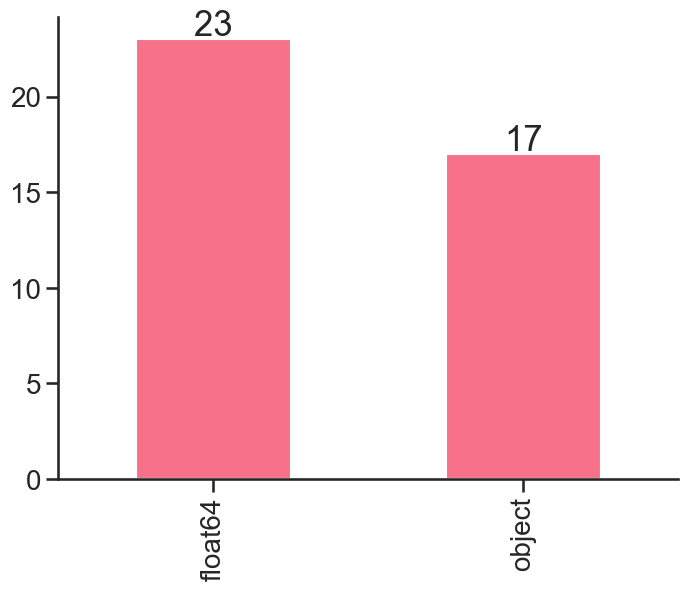

In [5]:
# 变量类型汇总
sns.set(style='ticks', context='talk', font_scale=1, palette='husl')
plt.figure(figsize=(8, 6))
ax = data.dtypes.value_counts().plot(kind='bar', grid=False, fontsize=20)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width() / 2., height + 0.2, height, ha = 'center', size = 25)
sns.despine()

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               60428 non-null  object 
 1   food_department             60428 non-null  object 
 2   food_family                 60428 non-null  object 
 3   store_sales(in millions)    60428 non-null  float64
 4   store_cost(in millions)     60428 non-null  float64
 5   unit_sales(in millions)     60428 non-null  float64
 6   promotion_name              60428 non-null  object 
 7   sales_country               60428 non-null  object 
 8   marital_status              60428 non-null  object 
 9   gender                      60428 non-null  object 
 10  total_children              60428 non-null  float64
 11  education                   60428 non-null  object 
 12  member_card                 60428 non-null  object 
 13  occupation                  604

# EDA

<AxesSubplot:>

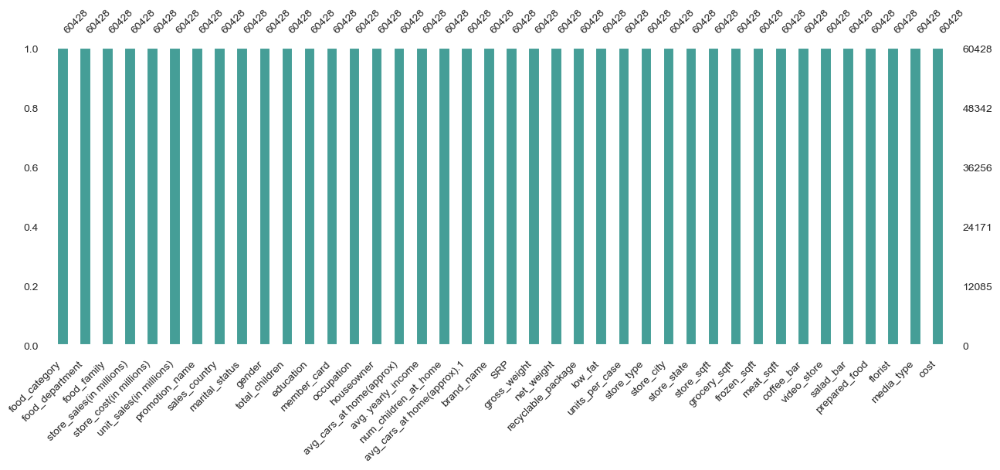

In [7]:
import missingno as msno
msno.bar(data,figsize=(15, 5),fontsize=10,color = '#459E97')

In [8]:
data.isnull().sum()

food_category                 0
food_department               0
food_family                   0
store_sales(in millions)      0
store_cost(in millions)       0
unit_sales(in millions)       0
promotion_name                0
sales_country                 0
marital_status                0
gender                        0
total_children                0
education                     0
member_card                   0
occupation                    0
houseowner                    0
avg_cars_at home(approx)      0
avg. yearly_income            0
num_children_at_home          0
avg_cars_at home(approx).1    0
brand_name                    0
SRP                           0
gross_weight                  0
net_weight                    0
recyclable_package            0
low_fat                       0
units_per_case                0
store_type                    0
store_city                    0
store_state                   0
store_sqft                    0
grocery_sqft                  0
frozen_s

In [9]:
# 查看是否有重复值
data.shape[0]

60428

In [10]:
data = data.drop_duplicates()
data.shape[0]

60428

In [11]:
# 查看数据唯一值数量
columns = data.columns
print('******************* Numeric field *******************\n')
for i in range(len(columns)):
    if data[columns[i]].dtypes!=object:
        print('unique number of {} -> {}'.format(columns[i], len(data[columns[i]].unique())))
        
print('\n******************* Categorical field *******************\n')
for i in range(len(columns)):
    if data[columns[i]].dtypes==object:
        print('unique number of {} -> {}'.format(columns[i], len(data[columns[i]].unique())))

******************* Numeric field *******************

unique number of store_sales(in millions) -> 1033
unique number of store_cost(in millions) -> 9919
unique number of unit_sales(in millions) -> 6
unique number of total_children -> 6
unique number of avg_cars_at home(approx) -> 5
unique number of num_children_at_home -> 6
unique number of avg_cars_at home(approx).1 -> 5
unique number of SRP -> 315
unique number of gross_weight -> 376
unique number of net_weight -> 332
unique number of recyclable_package -> 2
unique number of low_fat -> 2
unique number of units_per_case -> 36
unique number of store_sqft -> 20
unique number of grocery_sqft -> 20
unique number of frozen_sqft -> 20
unique number of meat_sqft -> 20
unique number of coffee_bar -> 2
unique number of video_store -> 2
unique number of salad_bar -> 2
unique number of prepared_food -> 2
unique number of florist -> 2
unique number of cost -> 328

******************* Categorical field *******************

unique number of food_c

In [12]:
# 查看分类变量唯一值
unique_values = {column: list(data[column].unique()) for column in data.select_dtypes(object).columns}
for key, value in unique_values.items():
    print(f'{key} : {value}')

food_category : ['Breakfast Foods', 'Bread', 'Canned Shrimp', 'Baking Goods', 'Vegetables', 'Frozen Desserts', 'Candy', 'Snack Foods', 'Dairy', 'Starchy Foods', 'Cleaning Supplies', 'Decongestants', 'Meat', 'Hot Beverages', 'Jams and Jellies', 'Carbonated Beverages', 'Seafood', 'Specialty', 'Kitchen Products', 'Electrical', 'Beer and Wine', 'Candles', 'Fruit', 'Pure Juice Beverages', 'Canned Soup', 'Paper Products', 'Canned Tuna', 'Eggs', 'Hardware', 'Canned Sardines', 'Canned Clams', 'Pain Relievers', 'Side Dishes', 'Bathroom Products', 'Magazines', 'Frozen Entrees', 'Pizza', 'Cold Remedies', 'Canned Anchovies', 'Drinks', 'Hygiene', 'Plastic Products', 'Canned Oysters', 'Packaged Vegetables', 'Miscellaneous']
food_department : ['Frozen Foods', 'Baked Goods', 'Canned Foods', 'Baking Goods', 'Produce', 'Snacks', 'Snack Foods', 'Dairy', 'Starchy Foods', 'Household', 'Health and Hygiene', 'Meat', 'Beverages', 'Seafood', 'Deli', 'Alcoholic Beverages', 'Canned Products', 'Eggs', 'Periodical

In [13]:
# 去除特殊符号
for col in data.columns:
    if '$' in data[col].to_string():
            data[col + '_no_dollar'] = data[col].str.replace('$', '').str.replace(',', '')

In [14]:
data['media_type'].value_counts()

Daily Paper, Radio         6820
Product Attachment         5371
Daily Paper, Radio, TV     5284
Daily Paper                5119
Street Handout             5069
Radio                      4980
Sunday Paper               4859
In-Store Coupon            4495
Sunday Paper, Radio        4050
Cash Register Handout      4002
TV                         3576
Bulk Mail                  3457
Sunday Paper, Radio, TV    3346
Name: media_type, dtype: int64

In [15]:
data['low_fat'].unique()

array([0., 1.])

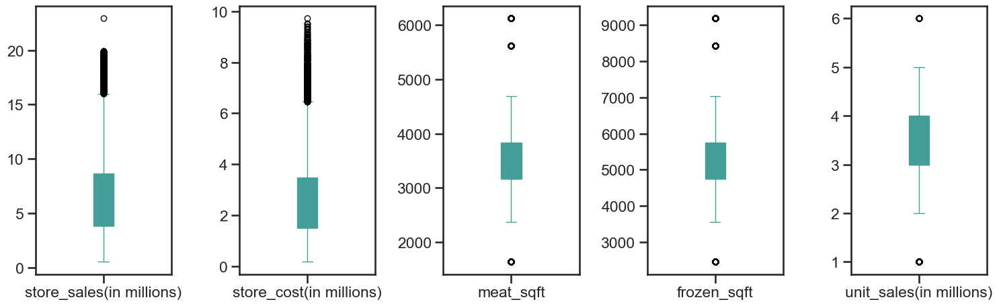

In [21]:
# 绘制定量变量箱线图
numeric_data = data[['store_sales(in millions)','store_cost(in millions)','meat_sqft','frozen_sqft','unit_sales(in millions)']]
numeric_data.plot(subplots =True, kind = 'box', layout = (5,8), figsize = (30,30),patch_artist=True,color='#459E97')
plt.subplots_adjust(wspace = 0.5)
plt.style.use('ggplot')
plt.show()

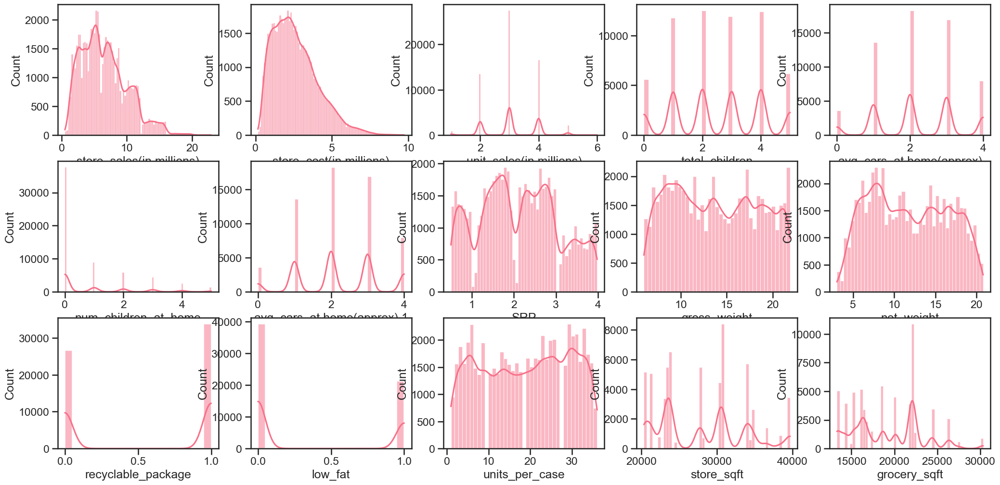

In [25]:
# 绘制数据分布图
columns_lst = [col for col in data.columns if data[col].dtype != 'O']
rows = 3
cols = 5
cnt = 0
fig, axs = plt.subplots(rows, cols, figsize=(25, 12))
for i in range(rows):
    for j in range(cols):
        sns.histplot(ax=axs[i, j], data=data, x=columns_lst[cnt], kde=True)
        cnt += 1

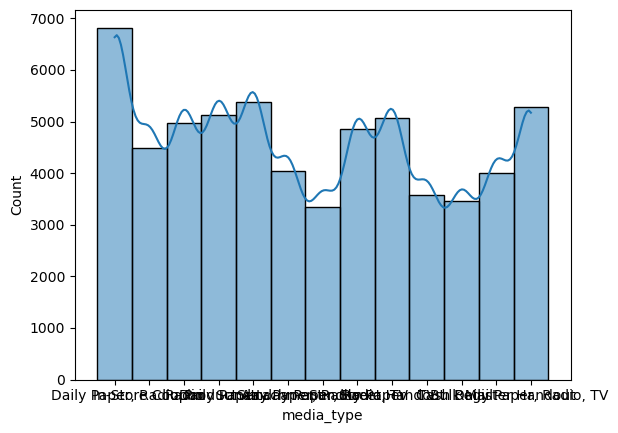

In [5]:
# cost分布
plt.figure()
sns.histplot(data=data, x=data.columns[-2], kde=True)
plt.show()

In [6]:
# 产品净重和单位销售额关系
pd.set_option('display.float_format', lambda x: '%.3f' % x)
item_visibility_sales = data.groupby('net_weight')[['unit_sales(in millions)']].sum().sort_values(by=['unit_sales(in millions)'],
                    ascending=[False]).reset_index()
item_visibility_sales.sort_values(by=['unit_sales(in millions)'],ascending=[False])

,net_weight,unit_sales(in millions)
0,16.200,3137.000
1,11.600,2955.000
2,10.600,2763.000
3,16.700,2540.000
4,11.100,2499.000
...,...,...
327,4.960,92.000
328,8.430,87.000
329,5.340,82.000
330,3.900,75.000


In [7]:
import plotly.express as px
fig = px.scatter(data, x='net_weight', y='unit_sales(in millions)', color='net_weight')
fig.show()

In [8]:
# 食物类别分类图
df = data.groupby('food_category')[['unit_sales(in millions)']].sum().sort_values(by=['unit_sales(in millions)'],ascending=[False]).reset_index()
px.bar(df, x= 'food_category', y='unit_sales(in millions)',color='food_category',color_discrete_sequence=px.colors.qualitative.Bold)

In [9]:
# 最热销的产品
grp_product = data.groupby('food_category')
sales_by_product = grp_product['unit_sales(in millions)'].mean().reset_index()
sales_by_product = sales_by_product.sort_values(by='unit_sales(in millions)', ascending=False)
sales_by_product.iloc[:10,0]

32          Miscellaneous
8            Canned Clams
6                   Candy
37       Plastic Products
33    Packaged Vegetables
10        Canned Sardines
23         Frozen Entrees
2           Beer and Wine
43          Starchy Foods
35         Paper Products
Name: food_category, dtype: object

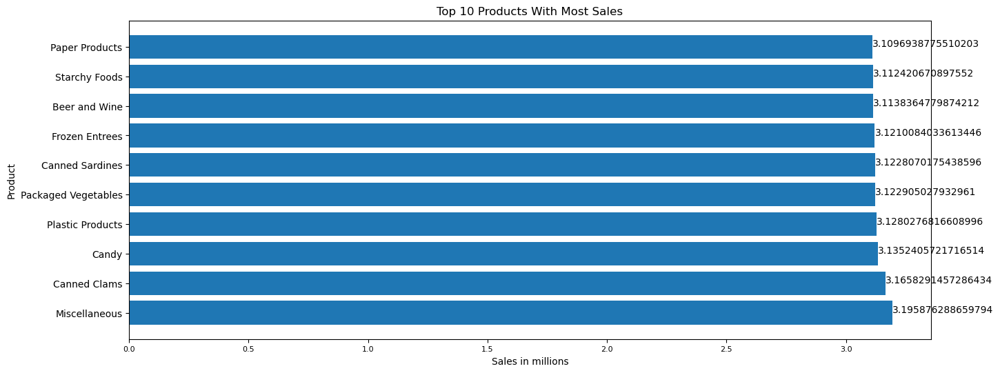

In [10]:
# 绘图查看
plt.figure(figsize=(15,6))
plt.barh(sales_by_product[:10]['food_category'], sales_by_product[:10]['unit_sales(in millions)'])
plt.xticks(size=8)
plt.xlabel('Sales in millions')
plt.ylabel('Product')
plt.title('Top 10 Products With Most Sales')
for index, value in enumerate(sales_by_product[:10]['unit_sales(in millions)']):
    plt.text(value, index,
             str(value))
plt.show()

In [11]:
# 查看不同地区销售情况
top_region = data.groupby('sales_country')['unit_sales(in millions)'].sum().sort_values(ascending=False).head(10)
top_region = top_region.reset_index()
import plotly.graph_objects as go
fig = go.Figure(go.Pie(labels=top_region.sales_country,
                             values = top_region['unit_sales(in millions)'],
                             customdata = top_region['unit_sales(in millions)'],
                            hovertemplate = 'Region:%{label} <br> Sales: %{customdata} <extra></extra>',
                           pull= [0.1,0,0,0.1]))
fig.update_layout(title={'text': '<b>Sales in different Regions','y':0.9,'x':0.5,
                        'xanchor': 'center','yanchor': 'top'})
fig.show()

In [12]:
df_tier1=pd.DataFrame(data.loc[data['sales_country'] =='USA'])
df_tier2=pd.DataFrame(data.loc[data['sales_country'] =='Mexico']) 
df_tier3=pd.DataFrame(data.loc[data['sales_country'] =='Canada'])

In [13]:
df_tier1_list=df_tier1.groupby('food_department')[['cost']].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier1_list.rename(columns = {'food_department':'Items_Tier_1','cost':'Sales_of_usa'}, inplace = True)
df_tier1_list

,Items_Tier_1,Sales_of_usa
0,Checkout,101.306
1,Breakfast Foods,99.904
2,Canned Foods,99.501
3,Meat,99.470
4,Deli,99.273
5,Carousel,99.064
6,Snack Foods,98.970
7,Baked Goods,98.867
8,Eggs,98.854
9,Frozen Foods,98.837


In [14]:
df_tier2_list=df_tier2.groupby('food_department')[['cost']].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier2_list.rename(columns = {'food_department':'Items_Tier2','cost':'Sales_of_Mexico'}, inplace = True)
df_tier2_list

,Items_Tier2,Sales_of_Mexico
0,Periodicals,102.395
1,Canned Foods,102.146
2,Beverages,101.972
3,Baking Goods,101.732
4,Eggs,101.351
5,Health and Hygiene,101.145
6,Household,101.129
7,Snack Foods,100.796
8,Frozen Foods,100.785
9,Alcoholic Beverages,100.699


In [15]:
df_tier3_list=df_tier3.groupby('food_department')[['cost']].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier3_list.rename(columns = {'food_department':'Items_Tier3','cost':'Sales_of_canda'}, inplace = True)
df_tier3_list

,Items_Tier3,Sales_of_canda
0,Snacks,109.589
1,Periodicals,105.818
2,Canned Products,104.617
3,Health and Hygiene,103.927
4,Baked Goods,103.757
5,Breakfast Foods,102.233
6,Produce,101.861
7,Snack Foods,101.245
8,Frozen Foods,101.232
9,Deli,101.201


In [16]:
df_sales=pd.concat([df_tier1_list,df_tier2_list,df_tier3_list],axis=1)
df_sales

,Items_Tier_1,Sales_of_usa,Items_Tier2,Sales_of_Mexico,Items_Tier3,Sales_of_canda
0,Checkout,101.306,Periodicals,102.395,Snacks,109.589
1,Breakfast Foods,99.904,Canned Foods,102.146,Periodicals,105.818
2,Canned Foods,99.501,Beverages,101.972,Canned Products,104.617
3,Meat,99.470,Baking Goods,101.732,Health and Hygiene,103.927
4,Deli,99.273,Eggs,101.351,Baked Goods,103.757
5,Carousel,99.064,Health and Hygiene,101.145,Breakfast Foods,102.233
6,Snack Foods,98.970,Household,101.129,Produce,101.861
7,Baked Goods,98.867,Snack Foods,100.796,Snack Foods,101.245
8,Eggs,98.854,Frozen Foods,100.785,Frozen Foods,101.232
9,Frozen Foods,98.837,Alcoholic Beverages,100.699,Deli,101.201


In [17]:
import plotly.graph_objects as go
x=df_sales['Items_Tier_1']
y1=df_sales['Sales_of_usa']
y2=df_sales['Sales_of_Mexico']
y3=df_sales['Sales_of_canda']

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y1,
                    mode='lines+markers',line_color='rgb(0,100,80)',
                    name='Sales_of_usa'))
fig.add_trace(go.Scatter(x=x, y=y2,
                    mode='lines+markers',
                    name='Sales_of_Mexico'))
fig.add_trace(go.Scatter(x=x, y=y3,
                    mode='lines+markers',
                    name='Sales_of_canda'))

fig.show()

In [18]:
top_region = data.groupby('store_city')['unit_sales(in millions)'].mean().sort_values(ascending=False).head(10)
top_region = top_region.reset_index()
fig = go.Figure(go.Pie(labels=top_region.store_city,
                             values = top_region['unit_sales(in millions)'],
                             customdata = top_region['unit_sales(in millions)'],
                            hovertemplate = "Region:%{label} <br> Sales: %{customdata} <extra></extra>",
                           pull= [0.1,0,0,0.1],
                           
                            ))

fig.update_layout(
                   title={
                        'text': "<b>Sales in different Regions",
                        'y':0.9,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                 
                  )


fig.show()

In [19]:
# 不同规模超市销售额
store_type_relation = data.groupby('store_type')[['unit_sales(in millions)']].mean().sort_values(by=['unit_sales(in millions)'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'store_type', y='unit_sales(in millions)',color='store_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

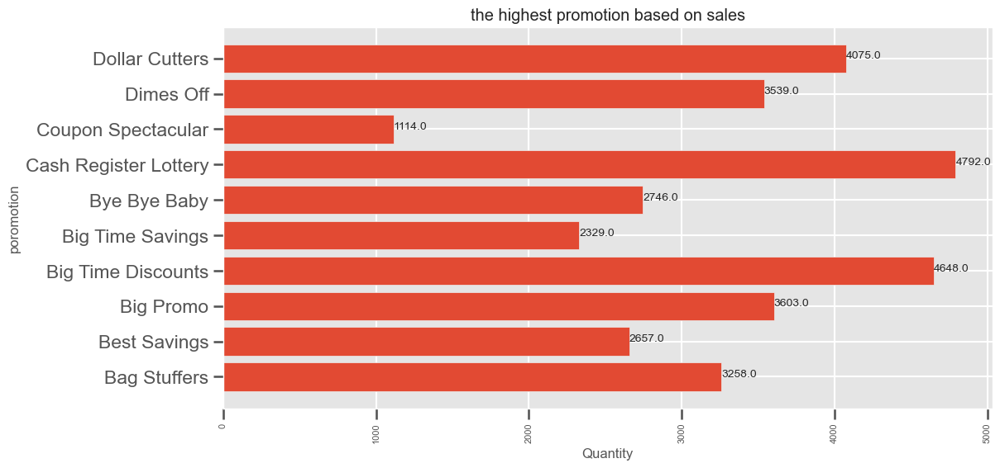

In [47]:
# 不同促销活动销售额
df_category_quantity = data.groupby('promotion_name')['unit_sales(in millions)'].sum().reset_index()
df_category_quantity.sort_values(by='unit_sales(in millions)', ascending=False)
plt.figure(figsize=(12,6))
plt.barh(df_category_quantity[:10]['promotion_name'], df_category_quantity[:10]['unit_sales(in millions)'])

plt.xticks(rotation='vertical', size=8)
plt.xlabel('Quantity')
plt.ylabel('poromotion')
plt.title('the highest promotion based on sales')
for index, value in enumerate(df_category_quantity[:10]['unit_sales(in millions)']):
    plt.text(value, index,
             str(value))

plt.show()

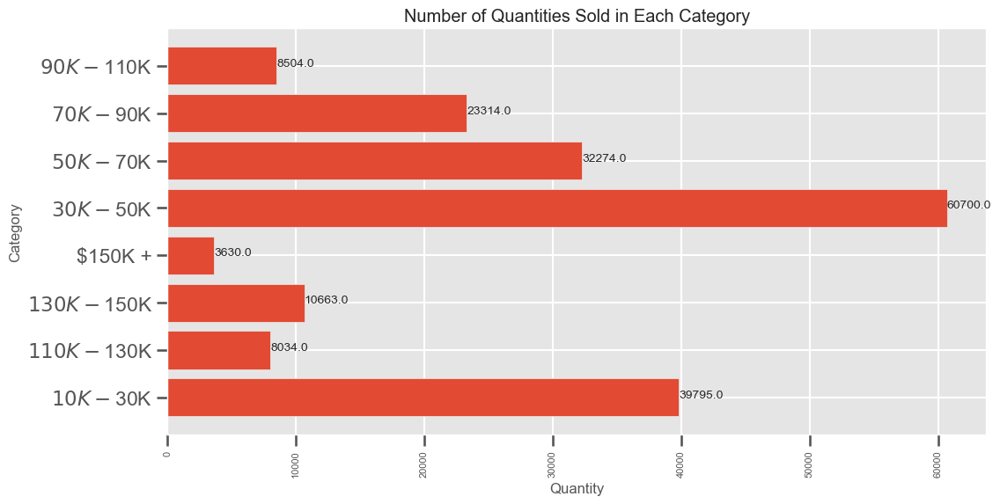

In [48]:
# 不同收入人群
df_category_quantity = data.groupby('avg. yearly_income')['unit_sales(in millions)'].sum().reset_index()
df_category_quantity.sort_values(by='unit_sales(in millions)', ascending=False)
plt.figure(figsize=(12,6))
plt.barh(df_category_quantity[:10]['avg. yearly_income'], df_category_quantity[:10]['unit_sales(in millions)'])

plt.xticks(rotation='vertical', size=8)
plt.xlabel('Quantity')
plt.ylabel('Category')
plt.title('Number of Quantities Sold in Each Category')
for index, value in enumerate(df_category_quantity[:10]['unit_sales(in millions)']):
    plt.text(value, index,
             str(value))
plt.show()

In [23]:
# 会员分布
pd.set_option('display.float_format', lambda x: '%.3f' % x)
outlet_size_sales = data.groupby('member_card')[['cost']].sum().reset_index()
outlet_size_sales.sort_values(by=['cost'],ascending=[False])

,member_card,cost
0,Bronze,3358180.070
2,Normal,1375474.260
1,Golden,746772.690
3,Silver,517799.240


In [24]:
data = data.groupby('member_card')[['unit_sales(in millions)']].sum().sort_values(by=['unit_sales(in millions)'],ascending=[False]).reset_index()
px.bar(data, x= 'member_card', y='unit_sales(in millions)',color='member_card',color_discrete_sequence=px.colors.qualitative.Set3)

In [20]:
# 媒体类型影响
store_type_relation = data.groupby('media_type')[['cost']].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'media_type', y='cost',color='media_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

In [21]:
store_type_relation = data.groupby('media_type')[['unit_sales(in millions)']].mean().sort_values(by=['unit_sales(in millions)'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'media_type', y='unit_sales(in millions)',color='media_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

Text(0.5, 0.95, 'the highest media type according to cost in each country')

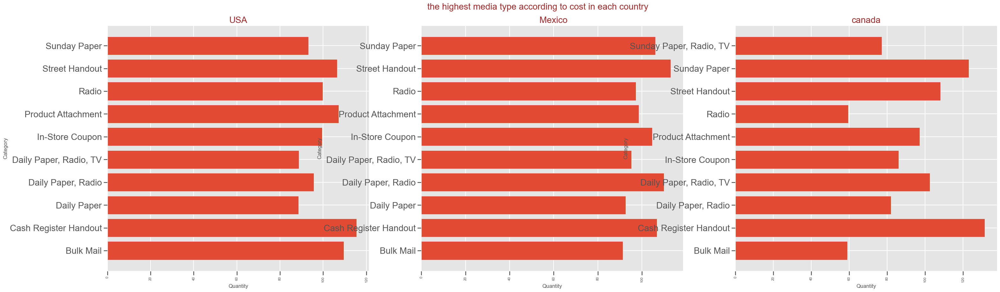

In [52]:
# 不同国家媒体类型影响
usa_store = data[data['sales_country']=='USA']  
Mexico_store = data[data['sales_country']=='Mexico']  
Canada_store = data[data['sales_country']=='Canada'] 
 
stores=['USA',' Mexico','canada'] 
fig, ax = plt.subplots(1,3, figsize=(36,10)) 
 
for i,store in enumerate([usa_store , Mexico_store, Canada_store]): 
    fig.sca(ax[i]) 
    data_category_quantity = store.groupby('media_type')['cost'].mean().reset_index() 
    data_category_quantity.sort_values(by='cost', ascending=False) 
    plt.barh(data_category_quantity[:10]['media_type'], data_category_quantity[:10]['cost']) 
 
    plt.xticks(rotation='vertical', size=8) 
    plt.yticks(size=20)
    plt.xlabel('Quantity') 
    plt.ylabel('Category') 
    plt.title('net salary of of each poromotion  in Each super market')
    plt.title(stores[i], fontsize=20,color='brown') 
fig.suptitle('the highest media type according to cost in each country',fontsize=20, color='brown', y=.95)

# 特征工程

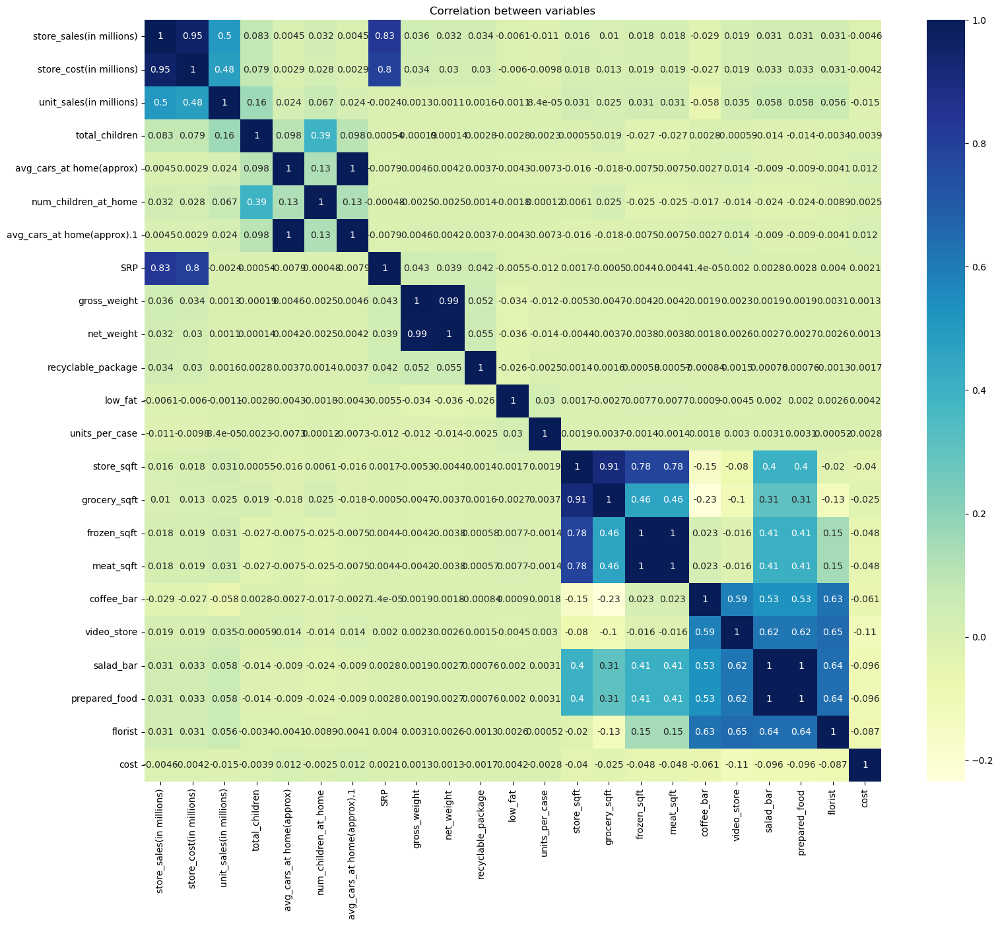

In [9]:
# 绘制相关图
plt.figure(figsize=(18, 15))
sns.heatmap(data=data.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation between variables')

In [4]:
# 筛选相关性高的特征
data = data.drop(columns=['salad_bar', 'gross_weight', 'avg_cars_at home(approx).1', 'meat_sqft',
                          'store_sales(in millions)', 'store_cost(in millions)', 'store_sqft'])

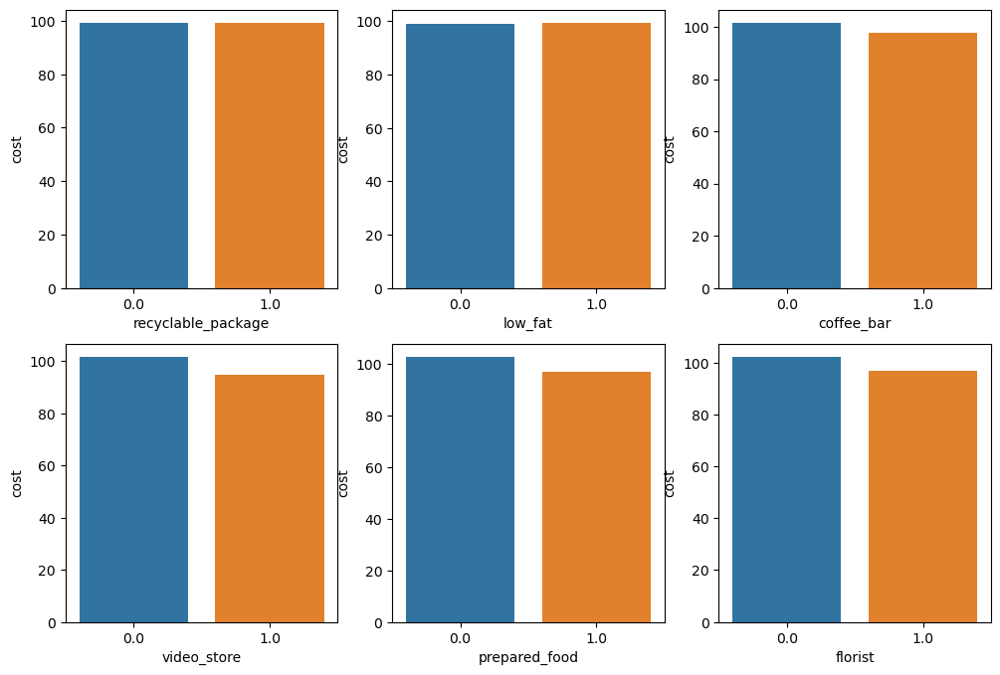

In [20]:
# 分类变量分布图
cate_lst = ['recyclable_package', 'low_fat', 'coffee_bar', 'video_store', 
            'prepared_food', 'florist']
rows = 2
cols = 3
cnt = 0
fig, axs = plt.subplots(rows, cols, figsize=(12, 8))
for i in range(rows):
    for j in range(cols):
        sns.barplot(ax=axs[i, j], data=data.groupby(cate_lst[cnt])['cost'].mean().to_frame().reset_index(),
                   x=cate_lst[cnt], y='cost')
        cnt += 1

In [25]:
# t检验
# H0: lst_0 和 lst_1有区别 
# H1: lst0 and lst_1没有区别 
alpha = .05
for ch in cate_lst:
    lst_0 = data.cost[data[ch] == 0]
    lst_1 = data.cost[data[ch] == 1]
    t, p = ttest_ind(lst_0, lst_1, equal_var=False)
    
    print(f'p-value = {p:.2f}, alpha = {alpha:.2f}')
    if (p < alpha):
        print('p < alpha => 拒绝 H0 => ', ch, '对 cost 影响显著')
    else:
        print('p > alpha => 无法拒绝 H0 => ', ch, '对 cost 影响不显著')
    print('\n')

p-value = 0.67, alpha = 0.05
p > alpha => 无法拒绝 H0 =>  recyclable_package 对cost影响不显著


p-value = 0.30, alpha = 0.05
p > alpha => 无法拒绝 H0 =>  low_fat 对cost影响不显著


p-value = 0.00, alpha = 0.05
p < alpha => 拒绝 H0 =>  coffee_bar 对cost影响显著


p-value = 0.00, alpha = 0.05
p < alpha => 拒绝 H0 =>  video_store 对cost影响显著


p-value = 0.00, alpha = 0.05
p < alpha => 拒绝 H0 =>  prepared_food 对cost影响显著


p-value = 0.00, alpha = 0.05
p < alpha => 拒绝 H0 =>  florist 对cost影响显著




In [5]:
# 去除影响不显著的变量
data = data.drop(columns=['recyclable_package', 'low_fat'])

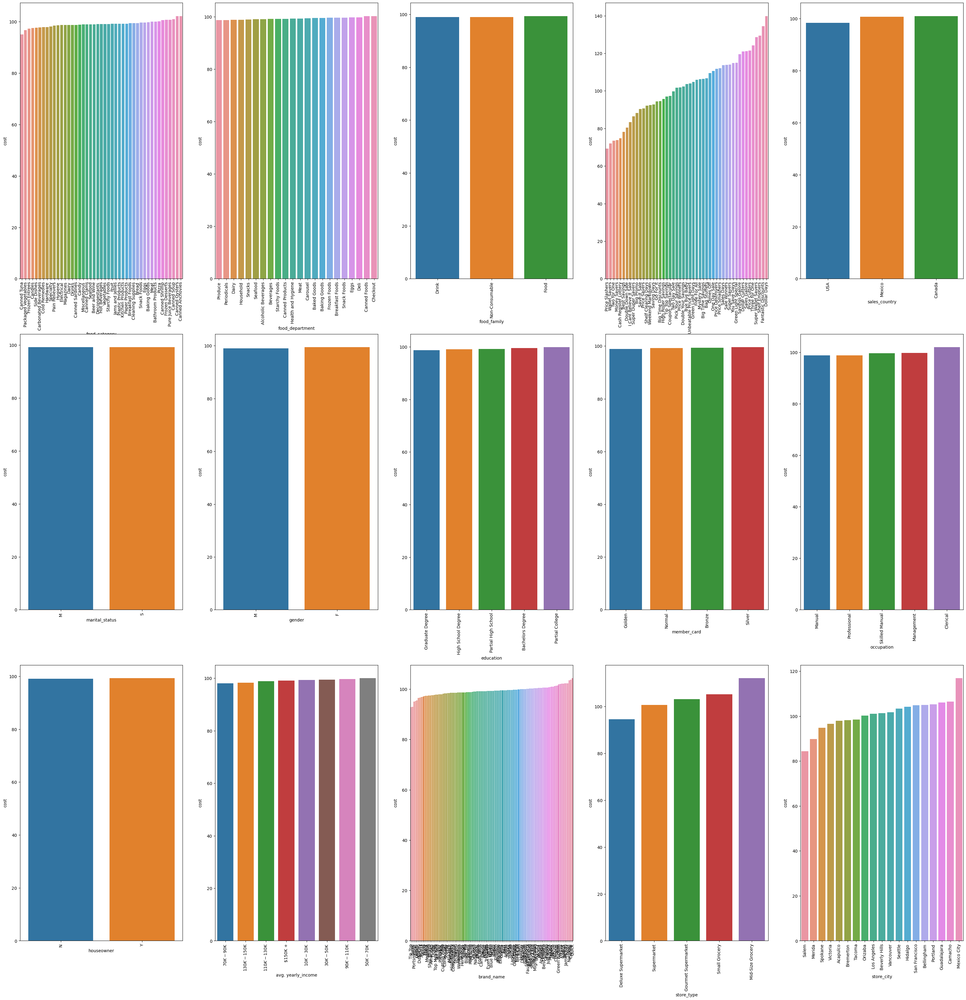

In [28]:
cate_lst = [col for col in data.columns if data[col].dtype == 'O']
rows = 3
cols = 5
cnt = 0
fig, axs = plt.subplots(rows, cols, figsize=(40, 40))
for i in range(rows):
    for j in range(cols):
        sns.barplot(ax=axs[i, j], data=data.groupby(cate_lst[cnt]
            )['cost'].mean().sort_values().to_frame().reset_index(), x=cate_lst[cnt], y='cost')
        axs[i, j].tick_params(axis='x', rotation=90)
        cnt += 1

In [6]:
data = data.drop(columns=['food_category', 'food_department', 'food_family', 'gender', 'marital_status',
                         'brand_name', 'avg. yearly_income', 'education', 'member_card', 'houseowner', 
                          'sales_country', 'occupation'])

# 数据处理

In [7]:
# 顺序编码
df = data.copy()
store_type_encoder = OrdinalEncoder()
df['store_type'] = store_type_encoder.fit_transform(np.array(df['store_type']).reshape(-1, 1))
store_city_encoder = OrdinalEncoder()
df['store_city'] = store_city_encoder.fit_transform(np.array(df['store_city']).reshape(-1, 1))
# 类别编码
promotion_name_encoder = LabelEncoder()
df['promotion_name'] = promotion_name_encoder.fit_transform(np.array(df['promotion_name']).reshape(-1, 1))
store_state_encoder = LabelEncoder()
df['store_state'] = store_state_encoder.fit_transform(np.array(df['store_state']).reshape(-1, 1))
media_type_encoder = LabelEncoder()
df['media_type'] = media_type_encoder.fit_transform(np.array(df['media_type']).reshape(-1, 1))

In [13]:
data

,unit_sales(in millions),promotion_name,total_children,avg_cars_at home(approx),num_children_at_home,SRP,net_weight,units_per_case,store_type,store_city,store_state,grocery_sqft,frozen_sqft,coffee_bar,video_store,prepared_food,florist,media_type,cost
0,4.0,Bag Stuffers,1.0,1.0,1.0,1.84,17.70,17.0,Deluxe Supermarket,Salem,OR,18670.0,5415.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",126.62
1,3.0,Cash Register Lottery,0.0,4.0,0.0,1.84,17.70,17.0,Deluxe Supermarket,Salem,OR,18670.0,5415.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86
2,2.0,High Roller Savings,4.0,1.0,0.0,1.84,17.70,17.0,Deluxe Supermarket,Salem,OR,18670.0,5415.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16
3,2.0,Cash Register Lottery,2.0,2.0,2.0,1.84,17.70,17.0,Deluxe Supermarket,Salem,OR,18670.0,5415.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78
4,3.0,Double Down Sale,0.0,2.0,0.0,1.36,5.11,29.0,Deluxe Supermarket,Salem,OR,18670.0,5415.0,1.0,1.0,1.0,1.0,Radio,50.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60423,1.0,You Save Days,1.0,1.0,1.0,2.76,18.60,26.0,Small Grocery,San Francisco,CA,15321.0,4294.0,1.0,0.0,0.0,0.0,In-Store Coupon,95.25
60424,1.0,Price Cutters,2.0,2.0,0.0,1.60,15.30,36.0,Small Grocery,San Francisco,CA,15321.0,4294.0,1.0,0.0,0.0,0.0,Sunday Paper,69.42
60425,2.0,Weekend Markdown,1.0,3.0,0.0,2.76,18.60,26.0,Small Grocery,San Francisco,CA,15321.0,4294.0,1.0,0.0,0.0,0.0,"Sunday Paper, Radio, TV",67.51
60426,3.0,Sales Days,2.0,4.0,0.0,2.76,18.60,26.0,Mid-Size Grocery,Victoria,BC,27463.0,4193.0,1.0,0.0,0.0,1.0,Sunday Paper,132.88


In [8]:
# 划分数据和label
X = df
y = data['cost']

In [15]:
X

,unit_sales(in millions),promotion_name,total_children,avg_cars_at home(approx),num_children_at_home,SRP,net_weight,units_per_case,store_type,store_city,store_state,grocery_sqft,frozen_sqft,coffee_bar,video_store,prepared_food,florist,media_type,cost
0,4.0,0,1.0,1.0,1.0,1.84,17.70,17.0,0.0,12.0,5,18670.0,5415.0,1.0,1.0,1.0,1.0,3,126.62
1,3.0,6,0.0,4.0,0.0,1.84,17.70,17.0,0.0,12.0,5,18670.0,5415.0,1.0,1.0,1.0,1.0,3,59.86
2,2.0,18,4.0,1.0,0.0,1.84,17.70,17.0,0.0,12.0,5,18670.0,5415.0,1.0,1.0,1.0,1.0,3,84.16
3,2.0,6,2.0,2.0,2.0,1.84,17.70,17.0,0.0,12.0,5,18670.0,5415.0,1.0,1.0,1.0,1.0,5,95.78
4,3.0,11,0.0,2.0,0.0,1.36,5.11,29.0,0.0,12.0,5,18670.0,5415.0,1.0,1.0,1.0,1.0,7,50.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60423,1.0,48,1.0,1.0,1.0,2.76,18.60,26.0,3.0,13.0,1,15321.0,4294.0,1.0,0.0,0.0,0.0,5,95.25
60424,1.0,24,2.0,2.0,0.0,1.60,15.30,36.0,3.0,13.0,1,15321.0,4294.0,1.0,0.0,0.0,0.0,9,69.42
60425,2.0,47,1.0,3.0,0.0,2.76,18.60,26.0,3.0,13.0,1,15321.0,4294.0,1.0,0.0,0.0,0.0,11,67.51
60426,3.0,31,2.0,4.0,0.0,2.76,18.60,26.0,2.0,18.0,0,27463.0,4193.0,1.0,0.0,0.0,1.0,9,132.88


In [9]:
# 回归获取异常值
def find_outliners(model, X, y, sigmar=3):
    # 拟合预测
    try:
        y_pred = pd.Series(model.predict(X), index=y.index)
    except:
        model.fit(X, y)
        y_pred = pd.Series(model.predict(X), index=y.index)
    # 计算残差
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    # 计算z统计量
    z = (resid - mean_resid) / std_resid
    outliners = z[abs(z) > sigmar].index
    # 输出结果
    print('R2= ', model.score(X, y))
    print('MSE= ', mean_squared_error(y, y_pred))
    print('------------------------------------')
    print('mean of residuals: ', mean_resid)
    print('std of residuals: ', std_resid)
    print('-------------------------------------')
    print(len(outliners), 'outliners: ')
    print(outliners.tolist())
    # 绘图
    plt.figure(figsize=(15, 5))
    ax_131 = plt.subplot(1, 3, 1)
    plt.plot(y, y_pred, '.')
    plt.plot(y.loc[outliners], y_pred[outliners], 'ro')
    plt.legend(['Accepted', 'Outliners'])
    plt.xlabel('y')
    plt.ylabel('y_pred')
    
    ax132 = plt.subplot(1, 3, 2)
    plt.plot(y, y - y_pred, '.')
    plt.plot(y.loc[outliners], y_pred[outliners] - y.loc[outliners], 'ro')
    plt.legend(['Accepted', 'Outliners'])
    plt.xlabel('y')
    plt.ylabel('y - y_pred')
    
    ax133 = plt.subplot(1, 3, 3)
    z.plot.hist(bins=10, ax=ax133)
    z.loc[outliners].plot.hist(color='r', bins=10, ax=ax133)
    plt.legend(['Accepted', 'Outliners'])
    plt.xlabel('z')
    
    return outliners

R2=  0.9999999985173175
MSE=  1.3353937771185305e-06
------------------------------------
mean of residuals:  1.211642997995399e-06
std of residuals:  0.001155601318926752
-------------------------------------
655 outliners: 
[51, 190, 193, 351, 364, 384, 632, 633, 635, 952, 978, 979, 980, 1369, 1914, 1916, 1917, 2868, 2917, 3024, 3026, 3122, 3131, 4625, 4627, 4639, 4647, 4650, 4667, 6437, 6442, 6447, 6449, 6452, 6454, 6456, 6459, 6465, 6571, 6572, 6574, 6575, 6578, 6579, 6583, 6585, 6587, 6589, 6591, 6595, 6600, 6601, 6603, 6604, 6605, 6606, 6607, 6611, 6617, 6620, 6623, 6843, 7447, 7448, 7450, 7670, 7989, 8367, 8370, 8371, 8399, 8400, 8410, 8411, 8752, 8807, 8839, 8846, 8856, 9399, 9400, 9404, 9408, 9412, 10063, 10070, 10071, 10072, 10124, 10125, 10130, 10132, 10135, 10141, 10142, 10145, 10146, 10516, 10517, 10537, 10565, 10604, 10605, 11137, 11138, 11795, 11844, 11849, 11856, 11857, 11859, 12145, 12319, 12337, 12375, 12386, 12520, 12521, 12622, 12749, 12751, 12912, 12997, 12999, 131

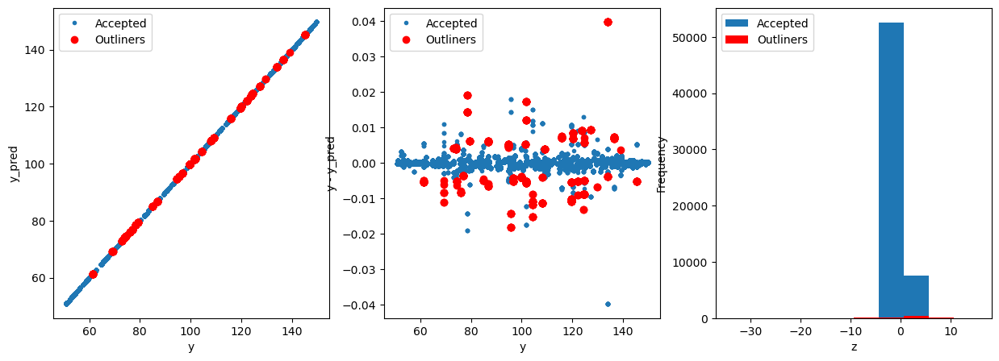

In [10]:
# 利用XGboost回归检测异常值
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
outliners = find_outliners(XGBRegressor(), X, y)

In [11]:
# 去除异常值
df.drop(outliners, inplace=True)
#X = df.drop(columns='cost')
#y = df['cost']
# 数据量降为10000
X = df.drop(columns='cost').iloc[:10000, :]
y = df['cost'].iloc[:10000]

In [12]:
X.shape, y.shape

((10000, 18), (10000,))

In [13]:
# 划分训练集测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, random_state=42, test_size=0.3)

In [14]:
# 查看训练集测试集规模
X_train.shape, X_test.shape

((7000, 18), (3000, 18))

# Eval

In [15]:
from sklearn.metrics import make_scorer
def rmse(y_true, y_pred):
    diff = y_true - y_pred
    sum_sq = diff ** 2
    n = len(y_true)
    return np.sqrt(sum_sq / n)
def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)
rmse_score = make_scorer(rmse, greater_is_better=False)
mse_score = make_scorer(mse, greater_is_better=False)

# Train

In [62]:
# 网格搜索训练模型
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
def train_model(model, param_grid=[], X=X_train, y=y_train, splits=5, repeats=1):
    rkfold = RepeatedKFold(n_splits=splits, n_repeats=repeats)
    if len(param_grid) > 0:
        gsearch = GridSearchCV(model, param_grid, cv=rkfold, scoring='neg_mean_squared_error',
            verbose=1, return_train_score=True)
        gsearch.fit(X, y)
        model = gsearch.best_estimator_
        best_idx = gsearch.best_index_
        
        grid_results = pd.DataFrame(gsearch.cv_results_)
        cv_mean = abs(grid_results.loc[best_idx, 'mean_test_score'])
        cv_std = grid_results.loc[best_idx, 'std_test_score']
    else:
        grid_results = []
        cv_results = cross_val_score(model, X, y, scoring='neg_mean_squared_error', 
                                    cv=rkfold)
        cv_mean = abs(np.mean(cv_results))
        cv_std = np.std(cv_results)
    cv_score = pd.Series({'mean': cv_mean, 'std': cv_std})
    y_pred = model.predict(X)
    
    print('---------------')
    print(model)
    print('---------------')
    print('score: ', model.score(X, y))
    print('rmse: ', rmse(y, y_pred))
    print('mse: ', mse(y, y_pred))
    print('mae', mean_absolute_error(y, y_pred))
    print('cross_val: mean= ', cv_mean, ', std= ', cv_std)
    
    y_pred = pd.Series(y_pred, index=y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid) / std_resid
    n_outliners = sum(abs(z) > 3)
    
    plt.figure(figsize=(15, 5))
    ax_131 = plt.subplot(1, 3, 1)
    plt.plot(y, y_pred, '.')
    plt.xlabel('y')
    plt.ylabel('y_pred')
    plt.title('corr: {:.3f}'.format(np.corrcoef(y, y_pred)[0][1]))
    
    ax_132 = plt.subplot(1, 3, 2)
    plt.plot(y, y - y_pred, '.')
    plt.xlabel('y')
    plt.ylabel('y - y_pred')
    plt.title('std resid = {:.3f}'.format(std_resid))
    
    ax_133 = plt.subplot(1, 3, 3)
    z.plot.hist(bins=10, ax=ax_133)
    plt.xlabel('z')
    plt.title('{:.0f} samples with z>3'.format(n_outliners))
    
    return model, cv_score, grid_results
opt_models = dict()
score_models = pd.DataFrame(columns=['mean', 'std'])
splits = 5
repeats = 1

1.单一模型回归

Fitting 5 folds for each of 23 candidates, totalling 115 fits
---------------
Ridge(alpha=5.75)
---------------
score:  0.032309593336656506
rmse:  9148    0.141468
2620    0.371961
7804    0.334157
1593    0.495228
5087    0.257159
          ...   
5763    0.287743
5220    0.002919
5419    0.442993
869     0.542570
7332    0.576615
Name: cost, Length: 7000, dtype: float64
mse:  888.291772715906
mae 25.676888351123893
cross_val: mean=  894.4356964853783 , std=  9.202300317107019


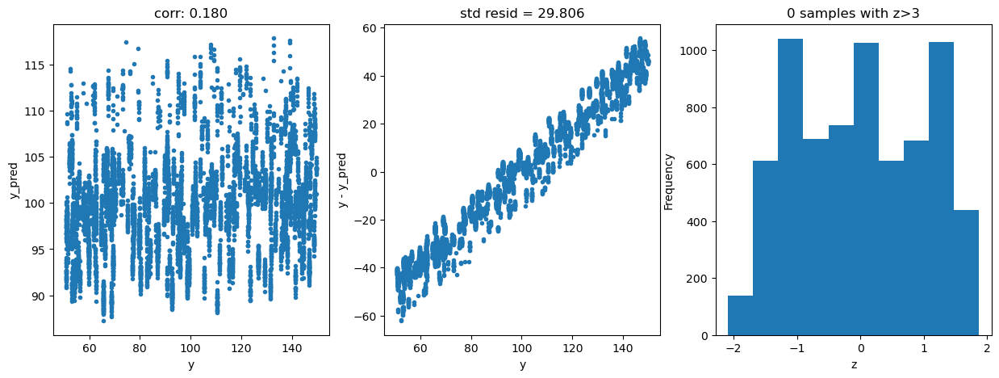

In [63]:
# 1.岭回归
from sklearn.linear_model import Ridge

model = 'Ridge'
opt_models[model] = Ridge()
alpha_range = np.arange(0.25, 6, 0.25)
param_grid = {'alpha': alpha_range}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], 
    param_grid=param_grid, splits=splits, repeats=repeats)
cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
---------------
KNeighborsRegressor(n_jobs=-1, n_neighbors=3)
---------------
score:  0.7955333708411109
rmse:  9148    0.000000e+00
2620    0.000000e+00
7804    7.629543e-02
1593    4.001625e-01
5087    0.000000e+00
            ...     
5763    0.000000e+00
5220    1.538259e-01
5419    8.492610e-17
869     2.412370e-01
7332    3.726723e-01
Name: cost, Length: 7000, dtype: float64
mse:  187.69021913015874
mae 7.232386666666668
cross_val: mean=  462.64012589365086 , std=  9.13435744510703


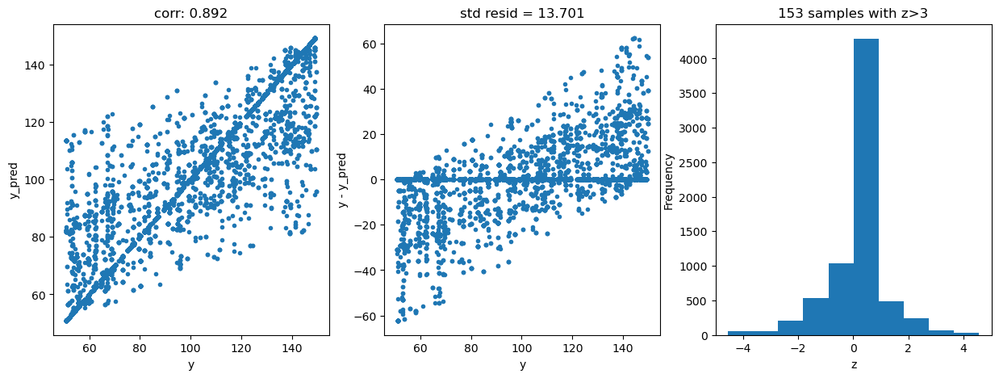

In [64]:
# 2.K近邻
from sklearn.neighbors import KNeighborsRegressor

model = 'KNeighbors'
opt_models[model] = KNeighborsRegressor(n_jobs=-1)
param_grid = {'n_neighbors': np.arange(3, 11, 2)}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], 
    param_grid=param_grid, X=X_train, y=y_train,splits=splits, repeats=repeats)
cv_score.name = model
score_models = score_models.append(cv_score)

2.模型融合Boosting方法

Fitting 5 folds for each of 8 candidates, totalling 40 fits
---------------
GradientBoostingRegressor(max_depth=7, min_samples_split=8, n_estimators=300,
                          random_state=42)
---------------
score:  0.9998686096340392
rmse:  9148    0.001788
2620    0.001340
7804    0.003320
1593    0.010528
5087    0.002321
          ...   
5763    0.003766
5220    0.002330
5419    0.003995
869     0.001911
7332    0.001084
Name: cost, Length: 7000, dtype: float64
mse:  0.12060983584569183
cross_val: mean=  7.797849289490193 , std=  2.1953312433528924


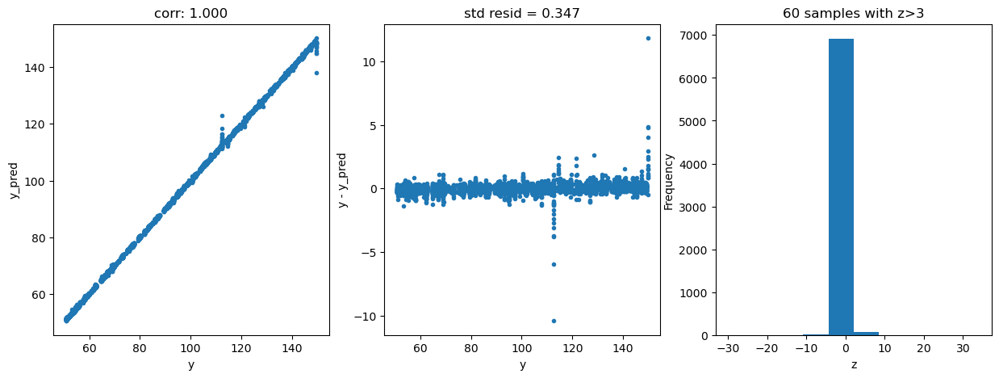

In [56]:
# 1.GBDT模型
from sklearn.ensemble import GradientBoostingRegressor

model = 'GradientBoosting'
opt_models[model] = GradientBoostingRegressor(random_state=42)
param_grid = {
            'max_depth': [6, 7],
            'min_samples_split': [4, 8],
            'n_estimators': [150, 300]
}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], 
    param_grid=param_grid, splits=splits, repeats=repeats)
cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
---------------
RandomForestRegressor(max_features=16, min_samples_split=4, n_estimators=200,
                      n_jobs=-1, random_state=42)
---------------
score:  0.9986022103112802
rmse:  9148    3.906601e-15
2620    2.887487e-15
7804    5.435270e-15
1593    1.170129e-03
5087    2.547783e-15
            ...     
5763    3.057340e-15
5220    3.868557e-04
5419    4.246305e-16
869     4.076453e-15
7332    7.473497e-15
Name: cost, Length: 7000, dtype: float64
mse:  1.2831015704270565
cross_val: mean=  9.256818261997598 , std=  2.5577214727377133


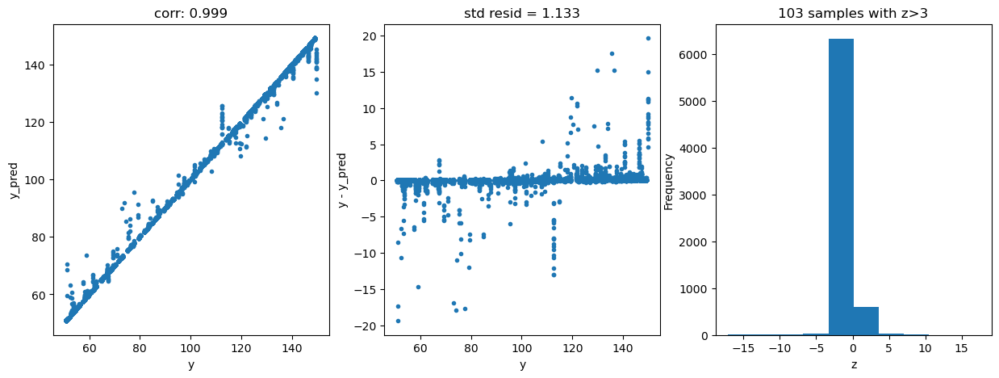

In [21]:
# 2.随机森林模型
from sklearn.ensemble import RandomForestRegressor

model = 'RandomForest'
opt_models[model] = RandomForestRegressor(n_jobs=-1, random_state=42)
param_grid = {'n_estimators': [100, 200],
             'max_features': [8, 16],
            'min_samples_split': [2, 4, 6]
             }

opt_models[model], cv_score, grid_results = train_model(opt_models[model], 
    param_grid=param_grid, splits=splits, repeats=1)
cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
---------------
XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False, eta=0.1,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.100000001, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=10, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=60, n_jobs=0,
             num_parallel_tree=1, predictor='auto', ...)
---------------
score:  0.9984500833003931
rmse:  9148    0.000499
2620    0.001868
7804    0.003313
1593    0.024178
5087    0.005758
          ...   
5763    0.000970
5220    0.003083
5419    0.014302
869     0.006105
7332   

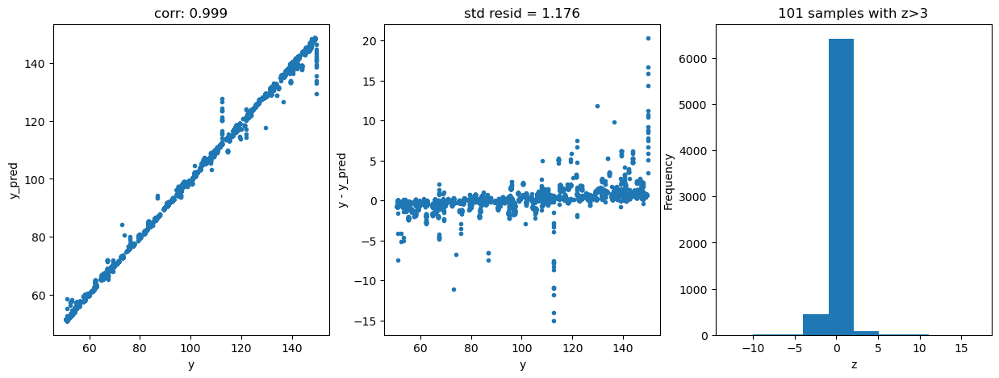

In [32]:
# 3.XGB模型
from  xgboost import XGBRegressor 

model = 'XGB'
opt_models[model] = XGBRegressor(objective='reg:squarederror')
param_grid = {'eta': [0.1, 0.5],
    'n_estimators' : [30, 60],
    'max_depth':[5, 10]
             }

opt_models[model], cv_score, grid_results = train_model(opt_models[model], 
    param_grid=param_grid, splits=splits, repeats=1)
cv_score.name = model
score_models = score_models.append(cv_score)

In [65]:
opt_models

{'Ridge': Ridge(alpha=5.75),
 'KNeighbors': KNeighborsRegressor(n_jobs=-1, n_neighbors=3)}

3.多模型预测Bagging方法

GradientBoosting_mse:  4.323558762017008
GradientBoosting_mae:  0.6230624436675788
GradientBoosting_r2:  0.9951602681244172
RandomForest_mse:  4.446939362361498
RandomForest_mae:  0.44748191656158
RandomForest_r2:  0.9950221575869679
XGB_mse:  4.49463448129764
XGB_mae:  0.8688589492289224
XGB_r2:  0.9949687683305404
mean_mse:  3.651598378
mean_mae:  0.5935946666666665
mean_r2:  0.995799617617429


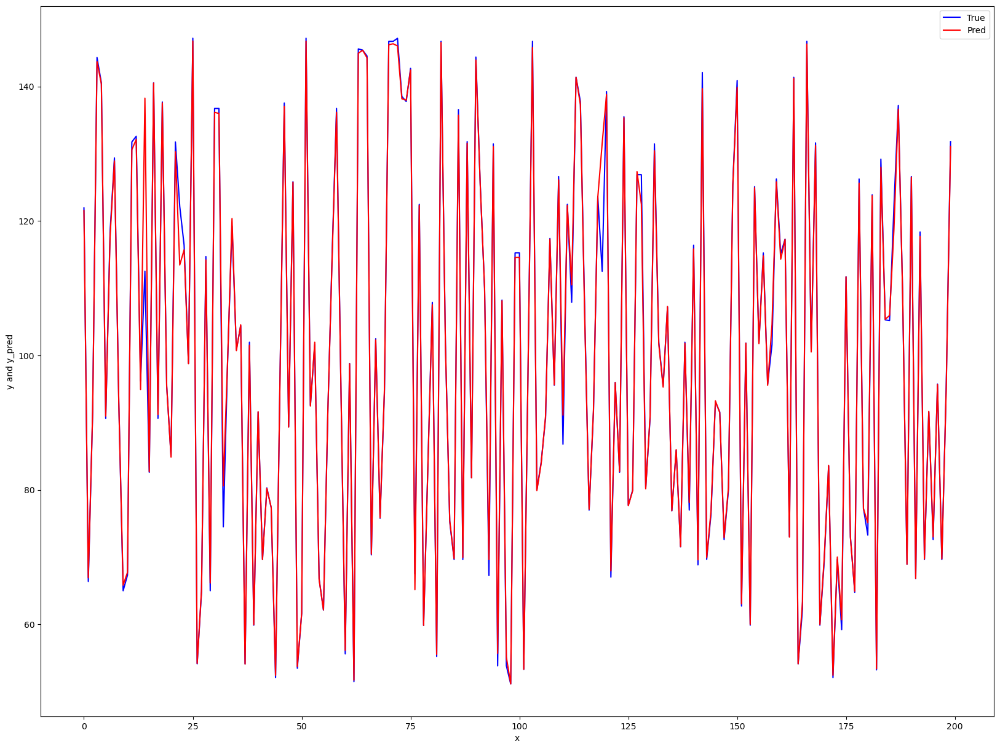

In [61]:
def model_predict(test_data, test_y=[], stack=False):
    i = 0
    y_pred_total = np.zeros((test_data.shape[0],))
    for model in opt_models.keys():
        if model != 'Ridge' and model != 'KNeighbors':
            y_preds = opt_models[model].predict(test_data)
            y_pred_total += y_preds
            i += 1
            if len(test_y) > 0:
                print('{}_mse: '.format(model), mean_squared_error(test_y, y_preds))
                print('{}_mae: '.format(model), mean_absolute_error(test_y, y_preds))
                print('{}_r2: '.format(model), r2_score(test_y, y_preds))
    y_pred_mean = np.round(y_pred_total / i, 3)
    if len(test_y) > 0:
        print('mean_mse: ', mean_squared_error(y_pred_mean, test_y))
        print('mean_mae: ', mean_absolute_error(y_pred_mean, test_y))
        print('mean_r2: ', r2_score(y_pred_mean, test_y))
        plt.figure(figsize=(20, 15))
        plt.plot(range(200), test_y[:200], color='blue')
        plt.plot(range(200), y_pred_mean[:200], color='red')
        plt.xlabel('x')
        plt.ylabel('y and y_pred')
        plt.legend(['True', 'Pred'])
    else:
        y_pred_mean = pd.Series(y_pred_mean)
        return y_pred_mean
model_predict(X_test, y_test)